## Machine Learning Approaches to Optimize Housing Development and Sales

### List of Content
- Business Understanding
- Data Understanding
- Data Preparation
- Modelling - Clustering
- Evaluation
- Deployment

#### Objective
  - Maximize the profit by value of the property.
  - Identify best type of properties with competitive prices to attract potential buyers

#### Situation
 - Real estate company interested in using machine learning to improve their business

#### Goal
  - Develop a machine learning model to optimize housing development and sales
  - Determine the best types of houses to build based on clustering analysis

#### Plan
  - Collect and explore data from the Ames Housing dataset on Kaggle
  - Use clustering analysis to group houses based on common characteristics and attributes
  - Implement findings to optimize housing development and sales


#### Collect Initial Data
- The dataset is collected from Kaggle and it contains test and train dataset
- Data Source: https://www.kaggle.com/datasets/prevek18/ames-housing-dataset

#### Describe Data
- The description of dataset is listed within a text file
- Dataset contains information on housing features such as location, size, number of rooms, and other amenities
- Columns Description: data_description.txt

#### <a style="color:blue;">Import libraries</a>

In [ ]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.stats import skew
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
os.getcwd()

'C:\\Users\\peili\\Downloads\\Data Analysis  Group Project'

#### <a style="color:blue;">Print Data Description</a>
- Columns Description of data is saved under data_description/txt

In [ ]:
# Print Data Description
# with open('data_description.txt', 'r') as file:
#     data_description = file.read()
#     print(data_description)

#### Explore Data - Explaratory Data Analysis (EDA)
- Analyze price sold, condition of the property, and characteristics of the property
- Procedure:
    - Import Dataset
    - Dataset Overview
    - Plot Distribution of Numeric Data
    - Plot Distribution of Categorical Data

#### <a style="color:blue;">Import Dataset</a>

In [ ]:
dataset = pd.read_csv('AmesHousing.csv')
dataset.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


#### <a style="color:blue;">Dataset Overview</a>
There are 2930 records (rows) and 82 attributes (columns). Dataset are mostly made up of numerical value (int64 & float64) and categorical value (object). Statistics are provided for numerical variables only.

In [ ]:
print ("Total rows & columns: " , dataset.shape, '\n')
dataset.info()

Total rows & columns:  (2930, 82) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 no

In [ ]:
dataset.describe()

,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2930.00000,2.930000e+03,2930.000000,2440.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2907.000000,...,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000
mean,1465.50000,7.144645e+08,57.387372,69.224590,10147.921843,6.094881,5.563140,1971.356314,1984.266553,101.896801,...,93.751877,47.533447,23.011604,2.592491,16.002048,2.243345,50.635154,6.216041,2007.790444,180796.060068
std,845.96247,1.887308e+08,42.638025,23.365335,7880.017759,1.411026,1.111537,30.245361,20.860286,179.112611,...,126.361562,67.483400,64.139059,25.141331,56.087370,35.597181,566.344288,2.714492,1.316613,79886.692357
min,1.00000,5.263011e+08,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,12789.000000
25%,733.25000,5.284770e+08,20.000000,58.000000,7440.250000,5.000000,5.000000,1954.000000,1965.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129500.000000
50%,1465.50000,5.354536e+08,50.000000,68.000000,9436.500000,6.000000,5.000000,1973.000000,1993.000000,0.000000,...,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,160000.000000
75%,2197.75000,9.071811e+08,70.000000,80.000000,11555.250000,7.000000,6.000000,2001.000000,2004.000000,164.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,213500.000000
max,2930.00000,1.007100e+09,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,...,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000,755000.000000


#### <a style="color:blue;">Plot Distribution of Numeric Data</a>


- Numerical Histogram and boxplot

**Observation**
- There are total of 39 columns which are numerical data
- Majority of numerical column's distribution are right skewed (25 attribute), however 2 of them are left skewed

In [ ]:
# separate columns by data type (Numerical and Categorical Data)
numerical_cols = dataset.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = dataset.select_dtypes(include=['object']).columns

# create new data frames with only numerical and categorical columns
numerical_data = dataset[numerical_cols]
categorical_data = dataset[categorical_cols]

In [ ]:
numerical_data.head()

,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
0,1,526301100,20,141.0,31770,6,5,1960,1960,112.0,...,210,62,0,0,0,0,0,5,2010,215000
1,2,526350040,20,80.0,11622,5,6,1961,1961,0.0,...,140,0,0,0,120,0,0,6,2010,105000
2,3,526351010,20,81.0,14267,6,6,1958,1958,108.0,...,393,36,0,0,0,0,12500,6,2010,172000
3,4,526353030,20,93.0,11160,7,5,1968,1968,0.0,...,0,0,0,0,0,0,0,4,2010,244000
4,5,527105010,60,74.0,13830,5,5,1997,1998,0.0,...,212,34,0,0,0,0,0,3,2010,189900


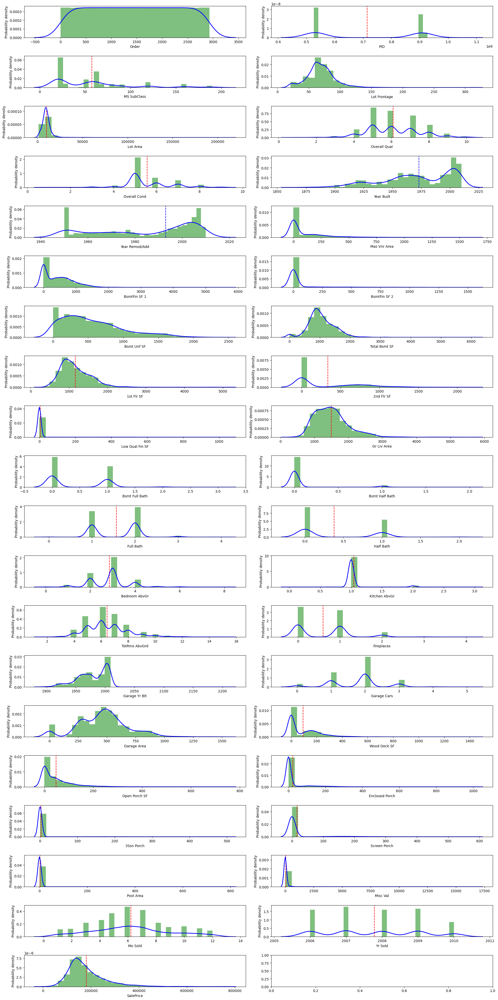

Number of columns with right skew: 25
Number of columns with left skew: 2


In [ ]:
fig, ax = plt.subplots(20, 2, figsize=(20, 40))
ax = ax.flatten()

right_skew_count = 0
left_skew_count = 0

for i, col in enumerate(numerical_cols):
    ax[i].hist(numerical_data[col], bins=30, density=True, alpha=0.5, color='green')
    ax[i].set_xlabel(col)
    ax[i].set_ylabel('Probability density')

    skewness = skew(numerical_data[col])
    #left skew, blue colour, if right skew, red colour
    if skewness > 0:
        right_skew_count += 1
        ax[i].axvline(np.mean(numerical_data[col]), color='r', linestyle='--', label='Mean')
    elif skewness < 0:
        left_skew_count += 1
        ax[i].axvline(np.median(numerical_data[col]), color='b', linestyle='--', label='Median')

    sns.kdeplot(numerical_data[col], ax=ax[i], color='blue', linewidth=2)

# Show the plot
plt.tight_layout()
plt.show()
print(f"Number of columns with right skew: {right_skew_count}")
print(f"Number of columns with left skew: {left_skew_count}")

In [ ]:
categorical_data.head()

,MS Zoning,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,...,Garage Type,Garage Finish,Garage Qual,Garage Cond,Paved Drive,Pool QC,Fence,Misc Feature,Sale Type,Sale Condition
0,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,...,Attchd,Fin,TA,TA,P,NaN,NaN,NaN,WD,Normal
1,RH,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,...,Attchd,Unf,TA,TA,Y,NaN,MnPrv,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,...,Attchd,Unf,TA,TA,Y,NaN,NaN,Gar2,WD,Normal
3,RL,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,...,Attchd,Fin,TA,TA,Y,NaN,NaN,NaN,WD,Normal
4,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,...,Attchd,Fin,TA,TA,Y,NaN,MnPrv,NaN,WD,Normal


In [ ]:
# Get unique values

unique_value = list()

for i in categorical_cols:
  unique_value.append(categorical_data[i].unique())

unique_values_tables = {'Categorical Columns': categorical_cols, 'Unique Value': unique_value}
unique_values_tables = pd.DataFrame(unique_values_tables)
unique_values_tables

,Categorical Columns,Unique Value
0,MS Zoning,"[RL, RH, FV, RM, C (all), I (all), A (agr)]"
1,Street,"[Pave, Grvl]"
2,Alley,"[nan, Pave, Grvl]"
3,Lot Shape,"[IR1, Reg, IR2, IR3]"
4,Land Contour,"[Lvl, HLS, Bnk, Low]"
5,Utilities,"[AllPub, NoSewr, NoSeWa]"
6,Lot Config,"[Corner, Inside, CulDSac, FR2, FR3]"
7,Land Slope,"[Gtl, Mod, Sev]"
8,Neighborhood,"[NAmes, Gilbert, StoneBr, NWAmes, Somerst, BrD..."
9,Condition 1,"[Norm, Feedr, PosN, RRNe, RRAe, Artery, PosA, ..."


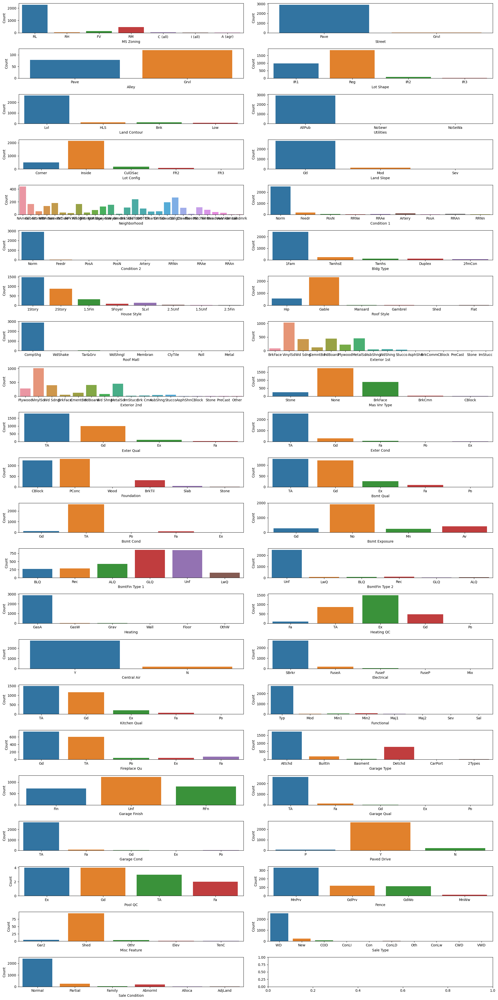

In [ ]:
# Plot count distribution for each categorical column
fig, ax = plt.subplots(22, 2, figsize=(20, 40))
ax = ax.flatten()

for i, col in enumerate(categorical_cols):
    sns.countplot(x=col, data=categorical_data, ax=ax[i])
    ax[i].set_xlabel(col)
    ax[i].set_ylabel('Count')

# Show the plot
plt.tight_layout()
plt.show()

#### <a style="color:blue;">Plot count distribution of categorical data</a>

**Observation:**
- Generally, most of the residents having following characteristics:

    - Low density resident
    - Paved streets
    - Gravel alley
    - Regular sized property
    - Near Flat level
    - Available with electric power, natural gas, steam supply, water supply, and sewage removal
    - Inside lot
    - Gentle slope of property
    - Single-family Detached
    - Single storey
    - Gable roof
    - Standard (Composite) Shingle roof
    - Good quality Vinyl Siding exteriors
    - Slight damped basement
    - No walkout or garden level walls
    - Gas forced warm air furnace
    - Excellent heating quality
    - Has Air-conditioning
    - Standard Circuit Breakers & Romex electrical system
    - Typical kitchen quality
    - Typical home functionality
    - Masonry Fireplace in main level
    - Typical unfinished garage attached to home
    - Paved driveway
    - Good pool quality
    - Minimum Wood/Wire fence
    - Warranty Deed – Conventional Sales
    - Normal Sales


#### Verify Data Quantity
- Check Missing Values
- Check Outlier
- Check Duplicate Values
- Encode Categorical Data
- Check Correlation

#### <a style="color:blue;">Check Missing Values</a>
- There are total of 27 columns existing with missing values
- 5 of them having the missing vales higher than 20%
    - Columns which having the missing values higher than 20%: PoolQC, MiscFeature, Alley, Fence, FireplaceQu

In [ ]:
missing_percentages = dataset.isnull().sum() / len(dataset) * 100

# print the missing percentages
missing_dataset = pd.DataFrame({'column_name': missing_percentages.index,
                           'missing_percentage': missing_percentages.values})
missing_dataset = missing_dataset.sort_values(by='missing_percentage', ascending=False)
missing_dataset = missing_dataset[missing_dataset['missing_percentage'] > 0]
print(missing_dataset)

       column_name  missing_percentage
73         Pool QC           99.556314
75    Misc Feature           96.382253
7            Alley           93.242321
74           Fence           80.477816
58    Fireplace Qu           48.532423
4     Lot Frontage           16.723549
65     Garage Cond            5.426621
61   Garage Finish            5.426621
60   Garage Yr Blt            5.426621
64     Garage Qual            5.426621
59     Garage Type            5.358362
33   Bsmt Exposure            2.832765
36  BsmtFin Type 2            2.764505
31       Bsmt Qual            2.730375
32       Bsmt Cond            2.730375
34  BsmtFin Type 1            2.730375
27    Mas Vnr Area            0.784983
26    Mas Vnr Type            0.784983
48  Bsmt Full Bath            0.068259
49  Bsmt Half Bath            0.068259
35    BsmtFin SF 1            0.034130
62     Garage Cars            0.034130
43      Electrical            0.034130
39   Total Bsmt SF            0.034130
38     Bsmt Unf SF       

#### <a style="color:blue;">Check Outlier</a>
- Outlier found in most of the columns (32 columns)
- Column with outlier: ['MS SubClass', 'Lot Frontage', 'Lot Area', 'Overall Qual', 'Overall Cond', 'Year Built', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath', 'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val']

Attribute with outlier: ['MS SubClass', 'Lot Frontage', 'Lot Area', 'Overall Qual', 'Overall Cond', 'Year Built', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath', 'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val']


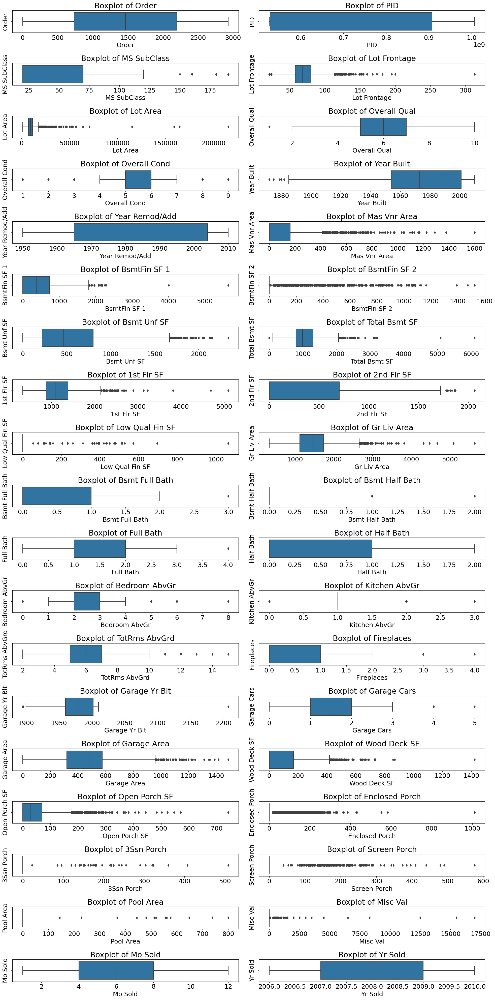

In [ ]:
plt.rcParams.update({'font.size': 18})

fig , ax = plt.subplots(19,2,figsize=(20,40))

numerical_var_count = 0
outlier_vars = []

for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):

        k = numerical_cols[numerical_var_count]

        sns.boxplot(x=numerical_data[k], ax=ax[i,j])
        ax[i,j].set(xlabel=k, ylabel=k)
        ax[i, j].set(title='Boxplot of '+k)

        Q1 = numerical_data[k].quantile(0.25)
        Q3 = numerical_data[k].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR

        if any(numerical_data[k] < lower) or any(numerical_data[k] > upper):
            outlier_vars.append(k)

        numerical_var_count = numerical_var_count + 1

plt.tight_layout()
print(f"Attribute with outlier: {outlier_vars}")

#### <a style="color:blue;">Check Duplicate Values</a>

In [ ]:
# check for sum of duplicates between columns
duplicates = dataset.duplicated().sum()

print(f"Number of duplicates: {duplicates}")

Number of duplicates: 0


#### <a style="color:blue;">Encode Categorical Data</a>

In [ ]:
# Perform ordinal encoding on categorical columns
encoder = OrdinalEncoder()
dataset_encode = dataset.copy()
categorical_cols_encode = categorical_cols.copy()

dataset_encode[categorical_cols_encode] = encoder.fit_transform(dataset_encode[categorical_cols_encode])

# Print the updated dataset
dataset_encode

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,5.0,141.0,31770,1.0,NaN,0.0,3.0,...,0,NaN,NaN,NaN,0,5,2010,9.0,4.0,215000
1,2,526350040,20,4.0,80.0,11622,1.0,NaN,3.0,3.0,...,0,NaN,2.0,NaN,0,6,2010,9.0,4.0,105000
2,3,526351010,20,5.0,81.0,14267,1.0,NaN,0.0,3.0,...,0,NaN,NaN,1.0,12500,6,2010,9.0,4.0,172000
3,4,526353030,20,5.0,93.0,11160,1.0,NaN,3.0,3.0,...,0,NaN,NaN,NaN,0,4,2010,9.0,4.0,244000
4,5,527105010,60,5.0,74.0,13830,1.0,NaN,0.0,3.0,...,0,NaN,2.0,NaN,0,3,2010,9.0,4.0,189900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,2926,923275080,80,5.0,37.0,7937,1.0,NaN,0.0,3.0,...,0,NaN,0.0,NaN,0,3,2006,9.0,4.0,142500
2926,2927,923276100,20,5.0,NaN,8885,1.0,NaN,0.0,2.0,...,0,NaN,2.0,NaN,0,6,2006,9.0,4.0,131000
2927,2928,923400125,85,5.0,62.0,10441,1.0,NaN,3.0,3.0,...,0,NaN,2.0,3.0,700,7,2006,9.0,4.0,132000
2928,2929,924100070,20,5.0,77.0,10010,1.0,NaN,3.0,3.0,...,0,NaN,NaN,NaN,0,4,2006,9.0,4.0,170000


#### <a style="color:blue;">Check Correlation</a>

- Order have high correclation with Yr Sold          |    0.975993
- GarageArea have high correlation with GarageCars   |    0.882475
- Exterior2nd have high correlation with Exterior1st |    0.854163
- Misc Val have high correlation with Misc Feature   |    0.832433
- YearBuilt have high correlation with GarageYrBlt   |    0.825667
- TotRmsAbvGrd have high correclation with GrLivArea |    0.825489
- TotalBsmtSF have high correclation with 1stFlrSF   |    0.819530


In [ ]:
#Correlation Matrix Heatmap
pearsoncorr = dataset_encode.corr(method='pearson')
pearsoncorr = pearsoncorr[((pearsoncorr >= .5) | (pearsoncorr <= -.5)) & (pearsoncorr !=1.000)]
plt.figure(figsize=(100,100))
sns.heatmap(dataset_encode.corr(method='pearson'),
            xticklabels=pearsoncorr.columns,
            yticklabels=pearsoncorr.columns,
            cmap='RdBu_r',
            annot=True,
            linewidth=0.4)

<Axes: >

In [ ]:
corr = dataset_encode.corr().abs()
corr[corr == 1] = 0
corr_cols = corr.max().sort_values(ascending=False)
print("Correlation > 0.8: ")
display(corr_cols[corr_cols > 0.8])

dfCorr = dataset_encode.corr()
filteredDf = dfCorr[((dfCorr >= .8) | (dfCorr <= -.8)) & (dfCorr !=1.000)]
plt.figure(figsize=(100,100))
sns.heatmap(filteredDf, annot=True, cmap="Reds", linecolor='black', linewidths=1)
plt.show()

Correlation > 0.8: 


Order            0.975993
Yr Sold          0.975993
Garage Area      0.889676
Garage Cars      0.889676
Exterior 2nd     0.865416
Exterior 1st     0.865416
Garage Yr Blt    0.834849
Year Built       0.834849
Misc Val         0.832433
Misc Feature     0.832433
TotRms AbvGrd    0.807772
Gr Liv Area      0.807772
1st Flr SF       0.800720
Total Bsmt SF    0.800720
dtype: float64

![Part%203.jpg](attachment:Part%203.jpg)

#### Select Data
- Identify and choose the relevant features that are essential for analysis, such as location, size, number of rooms, and other amenities
- Meaningless column have been removed in this stage

#### <a style="color:blue;">Remove MeaningLess Column</a>
- At this stage, we have removed irrelevant columns from the dataset.
- 'Order' & "PID" column is removed, as it is a unique identifier for each customer.
- 'GarageCars' column is removed, as it provides redundant information already captured by the 'GarageArea' column.
- We also removed the 'Exterior2nd' column, as it represents a limited set of additional choices for exterior covering.
- Furthermore, we removed the 'GarageYrBlt' column, as the year of construction is typically the same as the 'YearBuilt' column.
- Finally, we removed the 'TotRmsAbvGrd' column, as it provides a similar meaning as the 'First Floor' square footage.

In [ ]:
dataset = dataset.drop(['Order','PID','Garage Cars', 'Exterior 2nd', 'Garage Yr Blt', 'TotRms AbvGrd'], axis=1)

#### Clean Data
- Remove column with missing value more than 20%
- Impute numerical missing data using mean
- Impute categorical missing data using mode

#### <a style="color:blue;">Check missing value</a>

In [ ]:
missing_percentages = dataset.isnull().sum() / len(dataset) * 100

# print the missing percentages
missing_dataset = pd.DataFrame({'column_name': missing_percentages.index,
                           'missing_percentage': missing_percentages.values})
missing_dataset = missing_dataset.sort_values(by='missing_percentage', ascending=False)
missing_dataset = missing_dataset[missing_dataset['missing_percentage'] > 0]
print(missing_dataset)

       column_name  missing_percentage
67         Pool QC           99.556314
69    Misc Feature           96.382253
5            Alley           93.242321
68           Fence           80.477816
54    Fireplace Qu           48.532423
2     Lot Frontage           16.723549
59     Garage Cond            5.426621
56   Garage Finish            5.426621
58     Garage Qual            5.426621
55     Garage Type            5.358362
30   Bsmt Exposure            2.832765
33  BsmtFin Type 2            2.764505
28       Bsmt Qual            2.730375
29       Bsmt Cond            2.730375
31  BsmtFin Type 1            2.730375
24    Mas Vnr Area            0.784983
23    Mas Vnr Type            0.784983
45  Bsmt Full Bath            0.068259
46  Bsmt Half Bath            0.068259
32    BsmtFin SF 1            0.034130
57     Garage Area            0.034130
40      Electrical            0.034130
36   Total Bsmt SF            0.034130
35     Bsmt Unf SF            0.034130
34    BsmtFin SF 2       

#### <a style="color:blue;">Remove column with missing value more than 20%</a>
- 'PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu' column are removed from the column due to missing values is more than 20%

In [ ]:
dataset = dataset.drop(['Pool QC', 'Misc Feature', 'Alley', 'Fence', 'Fireplace Qu'], axis=1)

#### <a style="color:blue;">Impute numerical missing data using mean</a>
- Since most of the data is right skewed, median is choose to fill in missing values, rather than the mean.
- The mean is sensitive to extreme values and can be heavily influenced by outliers in the data, which can lead to biased estimates. In contrast, the median is a robust measure of central tendency that is less sensitive to extreme values and is more appropriate for skewed data.

In [ ]:
# separate columns by data type (Numerical and Categorical Data)
numerical_cols = dataset.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = dataset.select_dtypes(include=['object']).columns

# create new data frames with only numerical and categorical columns
numerical_data = dataset[numerical_cols]
categorical_data = dataset[categorical_cols]

In [ ]:
numerical_missing_percentages = numerical_data.isnull().sum() / len(dataset) * 100

# print the missing percentages
numerical_missing_dataset = pd.DataFrame({'column_name': numerical_missing_percentages.index,
                           'missing_percentage': numerical_missing_percentages.values})
numerical_missing_dataset = numerical_missing_dataset.sort_values(by='missing_percentage', ascending=False)
numerical_missing_dataset = numerical_missing_dataset[numerical_missing_dataset['missing_percentage'] > 0]
print(numerical_missing_dataset)

       column_name  missing_percentage
1     Lot Frontage           16.723549
7     Mas Vnr Area            0.784983
17  Bsmt Half Bath            0.068259
16  Bsmt Full Bath            0.068259
8     BsmtFin SF 1            0.034130
23     Garage Area            0.034130
11   Total Bsmt SF            0.034130
9     BsmtFin SF 2            0.034130
10     Bsmt Unf SF            0.034130


#### <a style="color:blue;">Impute categorical missing data using mode</a>

In [ ]:
categorical_missing_percentages = categorical_data.isnull().sum() / len(dataset) * 100

# print the missing percentages
categorical_missing_dataset = pd.DataFrame({'column_name': categorical_missing_percentages.index,
                           'missing_percentage': categorical_missing_percentages.values})
categorical_missing_dataset = categorical_missing_dataset.sort_values(by='missing_percentage', ascending=False)
categorical_missing_dataset = categorical_missing_dataset[categorical_missing_dataset['missing_percentage'] > 0]
print(categorical_missing_dataset)

       column_name  missing_percentage
33     Garage Cond            5.426621
32     Garage Qual            5.426621
31   Garage Finish            5.426621
30     Garage Type            5.358362
21   Bsmt Exposure            2.832765
23  BsmtFin Type 2            2.764505
20       Bsmt Cond            2.730375
22  BsmtFin Type 1            2.730375
19       Bsmt Qual            2.730375
15    Mas Vnr Type            0.784983
27      Electrical            0.034130


In [ ]:
for column in dataset.columns:
    if dataset[column].dtype == 'float64' or dataset[column].dtype == 'int64':
        # fill missing numerical values with the median of each column
        dataset[column] = dataset[column].fillna(dataset[column].median())
    elif dataset[column].dtype == 'object':
        # fill missing categorical values with the mode of each column
        dataset[column] = dataset[column].fillna(dataset[column].mode()[0])

In [ ]:
missing_percentages = dataset.isnull().sum() / len(dataset) * 100

# print the missing percentages
missing_dataset = pd.DataFrame({'column_name': missing_percentages.index,
                           'missing_percentage': missing_percentages.values})
missing_dataset = missing_dataset.sort_values(by='missing_percentage', ascending=False)
missing_dataset = missing_dataset[missing_dataset['missing_percentage'] > 0]
print(missing_dataset)

Empty DataFrame
Columns: [column_name, missing_percentage]
Index: []


#### Data Format
- Ensure all data is in the  appropriate format for analysis, such as converting categorical data to numerical values
    - Encode Data
    - Data Scaling

#### <a style="color:blue;">Encode Data</a>
- Clustering algorithms require numeric inputs, so encoding categorical data is necessary for these algorithms to work.

In [ ]:
# Perform ordinal encoding on categorical columns
encoder = OrdinalEncoder()

dataset[categorical_cols] = encoder.fit_transform(dataset[categorical_cols])

# Print the updated dataset
dataset.head()

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,...,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,20,5.0,141.0,31770,1.0,0.0,3.0,0.0,0.0,0.0,...,0,0,0,0,0,5,2010,9.0,4.0,215000
1,20,4.0,80.0,11622,1.0,3.0,3.0,0.0,4.0,0.0,...,0,0,120,0,0,6,2010,9.0,4.0,105000
2,20,5.0,81.0,14267,1.0,0.0,3.0,0.0,0.0,0.0,...,0,0,0,0,12500,6,2010,9.0,4.0,172000
3,20,5.0,93.0,11160,1.0,3.0,3.0,0.0,0.0,0.0,...,0,0,0,0,0,4,2010,9.0,4.0,244000
4,60,5.0,74.0,13830,1.0,0.0,3.0,0.0,4.0,0.0,...,0,0,0,0,0,3,2010,9.0,4.0,189900


In [ ]:
# create a MinMaxScaler object
scaler = MinMaxScaler()

#Normalize the dataset
normalized_dataset = scaler.fit_transform(dataset)

#convert the normalized numpy array back to a dataframe
dataset = pd.DataFrame(normalized_dataset, columns=dataset.columns)

#Print the updated dataset
dataset.head()

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,...,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,0.000000,0.833333,0.410959,0.142420,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.363636,1.0,1.0,0.8,0.272444
1,0.000000,0.666667,0.202055,0.048246,1.0,1.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.208333,0.0,0.000000,0.454545,1.0,1.0,0.8,0.124238
2,0.000000,0.833333,0.205479,0.060609,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.735294,0.454545,1.0,1.0,0.8,0.214509
3,0.000000,0.833333,0.246575,0.046087,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.272727,1.0,1.0,0.8,0.311517
4,0.235294,0.833333,0.181507,0.058566,1.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.181818,1.0,1.0,0.8,0.238626


#### <a style="color:blue;">Data Scaling</a>
- Ordinal encoding assigns each category in a categorical feature a unique integer value, based on the order of the categories. However, these integer values do not have a standardized scale, and some algorithms may interpret them as having an inherent order or numerical relationship between categories.
- Data scaling can help to standardize the scale of the feature values, so that the numerical values in different features are more comparable.

![Part%204%20and%205%20-%20Clarice.jpg](attachment:Part%204%20and%205%20-%20Clarice.jpg)

<font color="pink">**Dimensionality Reduction**</font>



* In this problem, the dataset contains numerous features that influence the final classification. However, managing a high number of features can be cumbersome.
*  Moreover, many of these features are correlated and redundant.
*  To mitigate these challenges, dimensionality reduction will be applied to the selected features before inputting them into a classifier.
*  This process aims to reduce the number of variables by extracting a set of principal components.


In this section, Principal Component Analysis (PCA) will be ultilized to reduce the dimensionality of our dataset. Tha aim is to enhance interpretability while minimizing the potential loss of information.


> The steps involved in this section are as follows:


1.   Dimensionality reduction with PCA: PCA applied to dataset, which will transform the original high-dimensional features into a lower-dimensional representation. PCA achieves this by identifying the principal components, which are new variables that capture the most significant variations in the data.

2.   Plotting the reduced dataframe: After performing dimensionality reduction with PCA, dataframe with a lower number of dimensions will reduced. To visualize the transformed data, the reduced dataframe plotted. The dimensions will reduced to 3, the data in a three-dimensional space can be plotted. This visualization will help in understanding the distribution and patterns in the reduced dataset.


By employing PCA and plotting the reduced dataframe, the aim is to gain insights into the relationships and structures within the data, enabling to make more informed interpretations and conclusion.Additionally, the reduced dimensions will aid in simplifying the dataset, making it more manageable for further analysis and decision making.

In [ ]:
from sklearn.decomposition import PCA

# Initiating PCA to reduce dimensions to 3
pca = PCA(n_components=3)
pca.fit(dataset)
PCA_ds = pd.DataFrame(pca.transform(dataset), columns=["col1", "col2", "col3"])
PCA_ds.describe().T

,count,mean,std,min,25%,50%,75%,max
col1,2930.0,-9.700242e-18,0.784741,-1.742392,-0.656326,-0.108406,0.688266,1.883959
col2,2930.0,-2.061301e-17,0.489058,-1.174024,-0.365794,-0.016604,0.315616,1.466262
col3,2930.0,2.000675e-17,0.448635,-1.295119,-0.308586,0.010788,0.309352,1.407337


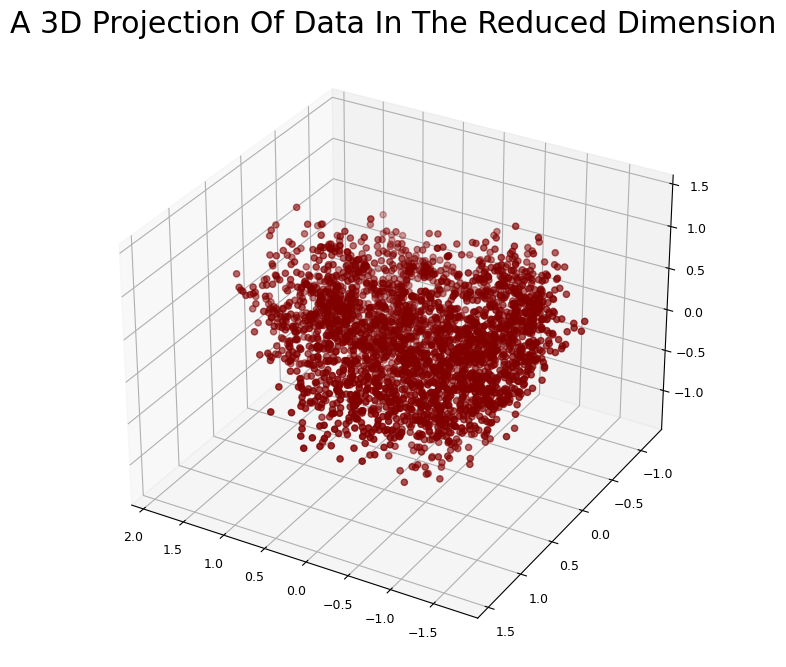

In [ ]:
#A 3D Projection Of Data In The Reduced Dimension
x =PCA_ds["col1"]
y =PCA_ds["col2"]
z =PCA_ds["col3"]

#To plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x, y, z, c="maroon", marker="o", s=20)  # Adjust the 's' parameter for smaller points

# Adjust size of numbers on axes
ax.tick_params(axis='x', labelsize=9)  # Adjust the 'labelsize' parameter for the desired size
ax.tick_params(axis='y', labelsize=9)
ax.tick_params(axis='z', labelsize=9)

# Adjust viewing angle
ax.view_init(elev=30, azim=120)  # Change the values of 'elev' and 'azim' for different angles

#Set title
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

PCA (Principal Component Analysis) is a dimensionality reduction technique that is used to find the main features in a high-dimensional data set, thus reducing the dimensionality of the data. With PCA, high-dimensional data can be transformed into low-dimensional data while retaining the most important information in the data. the goal of PCA is to find a new feature space in which the new features are called principal components, which are linear combinations of features in the original data. These principal components are ranked according to the magnitude of the variance, with the most important features at the top. By retaining the most important principal components, PCA enables data dimensionality reduction and retains the most relevant information in the original data. PCA is typically used in the data pre-processing stage to reduce the dimensionality of the input data and eliminate redundant features, while maintaining sensitivity to data changes.

<font color="pink">**Clustering**</font>

* Perform clustering using Agglomerative clustering.
* Agglomerative clustering is a hierarchical clustering technique which aims to create a hierarchy of clusters.
* The method involves iterative merging of examples.
* The merging process continues until the desired number of clusters is achieved.







**Steps involved in the Clustering**


> Elbow Method to determine the number of clusters to be formed

> Clustering via Agglomerative Clustering


> Examining the clusters formed via scatter plot

Elbow Method to determine the number of clusters to be formed:


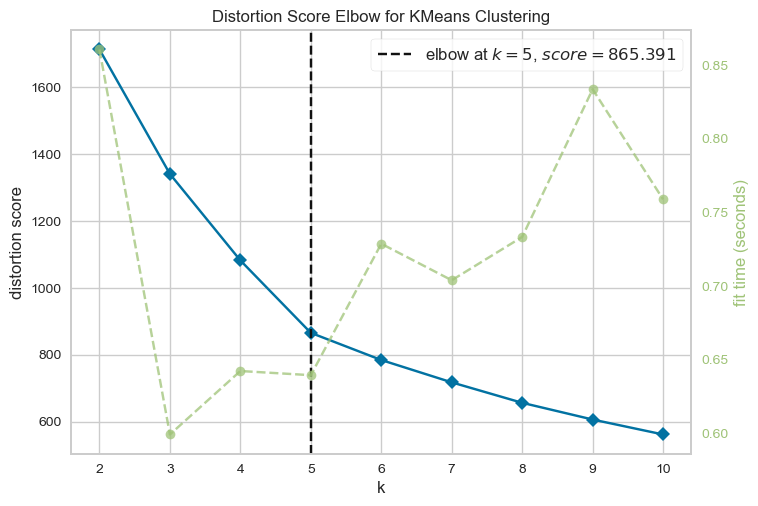

Optimal number of clusters (k): 5


In [ ]:
import warnings
import matplotlib.pyplot as plt
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
import random

# Set a random seed for reproducibility
random.seed(42)

# Suppress future warning about `n_init`
warnings.filterwarnings("ignore", category=FutureWarning)

# Quick examination of elbow method to determine the number of clusters to be formed
print('Elbow Method to determine the number of clusters to be formed:')
elbow_visualizer = KElbowVisualizer(KMeans(n_clusters=4, n_init=10), k=10)
elbow_visualizer.fit(PCA_ds)
elbow_visualizer.show()

# Display the optimal number of clusters
print('Optimal number of clusters (k):', elbow_visualizer.elbow_value_)

K-means clustering algorithm was used for modeling.
In the code, the first step is taken by creating a KMeans object KMeans(n_init=10).During the fitting process, elbow visualizer will try to run the K-means algorithm using different numbers of clusters (in this case 2 to 10 clusters) and calculate the value of the clustering loss function for each number of clusters. Finally, visualize the clustering loss function values versus the number of clusters by method to help select the appropriate number of clusters. elbow_visualizer.show()
This code uses the K-means clustering algorithm and the Yellowbrick library to perform the "elbow method" to determine the optimal number of clusters.

<font color="purple">**Fit Agglomerative Clustering Model**</font>


In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Perform PCA
pca = PCA(n_components=3)
PCA_ds = pd.DataFrame(pca.fit_transform(dataset), columns=['PC1', 'PC2', 'PC3'])

# Initiating the Agglomerative Clustering model
AC = AgglomerativeClustering(n_clusters=4)

# Fit the model and predict clusters
yhat_AC = AC.fit_predict(PCA_ds)
PCA_ds["Clusters"] = yhat_AC

# Add the Clusters feature to the original dataframe
dataset["Clusters"] = yhat_AC

This code performs PCA for dimensionality reduction, followed by agglomerative clustering using the transformed data. The resulting cluster labels are then added as a new feature in the original  DataFrame

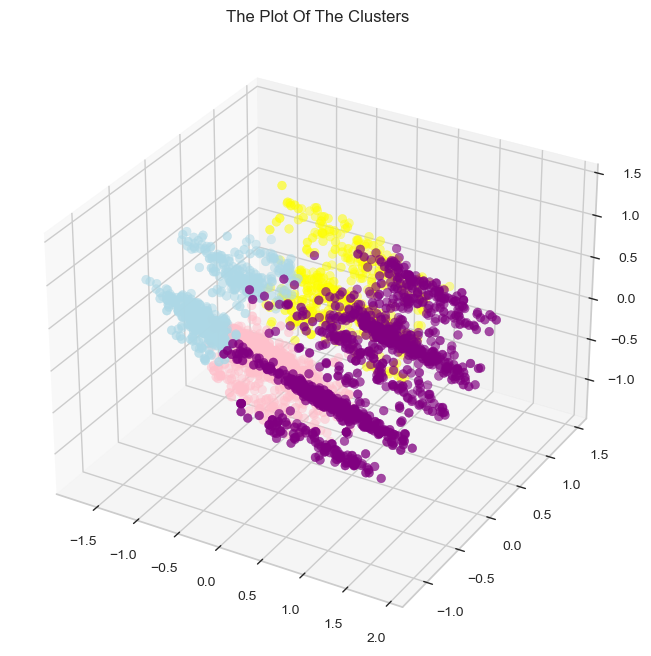

In [ ]:
# Import the required colormap from matplotlib
from matplotlib import cm

# Define the custom colormap using the desired colors
custom_cmap = cm.colors.ListedColormap(['purple', 'pink', 'lightblue', 'yellow'])

# Plotting the clusters
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, s=40, c=PCA_ds["Clusters"], marker='o', cmap=custom_cmap)
ax.set_title("The Plot Of The Clusters")
plt.show()

This code sets up a 3D plot () and adds a subplot () with a 3D projection. The scatter plot is created using the  function.The  parameter sets the size of the markers, and the  parameter assigns colors to the markers based on the "Clusters" column of the  dataframe. The  parameter specifies the marker style for the scatter points. The  parameter assigns the custom colormap () to the scatter plot. Finally, the title is set for the plot, and  displays the plot

<font color="pink">**Evaluating Models**</font>


>Since this is an unsupervised clustering problem, there is no labeled feature available to evaluate or score the model. The objective of this analysis is to study the patterns within the formed clusters and understand their nature.


> To achieve this, exploratory data analysis will be conducted to examine the data in relation to the clusters. By doing so, conclusions can be drawn about the distribution of groups within the clustering results.



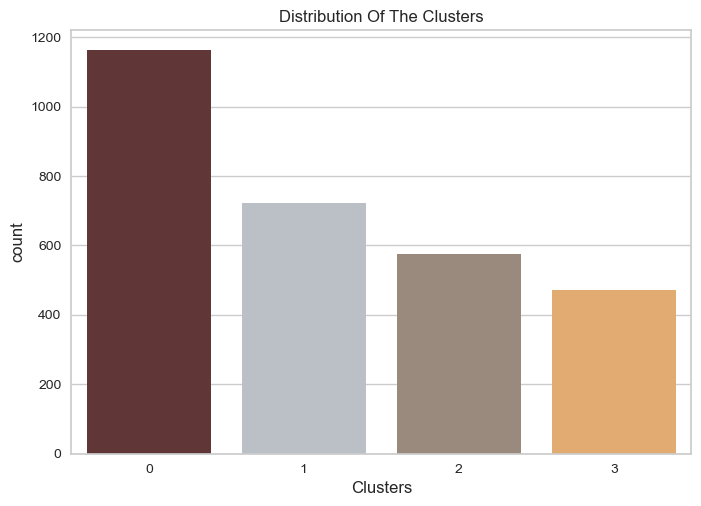

In [ ]:
#Plotting countplot of clusters
pal = ["#682F2F","#B9C0C9", "#9F8A78","#F3AB60"] #Defining a custom color palette:
pl = sns.countplot(x=dataset["Clusters"], palette= pal) #Plotting the countplot:
pl.set_title("Distribution Of The Clusters")
plt.show()

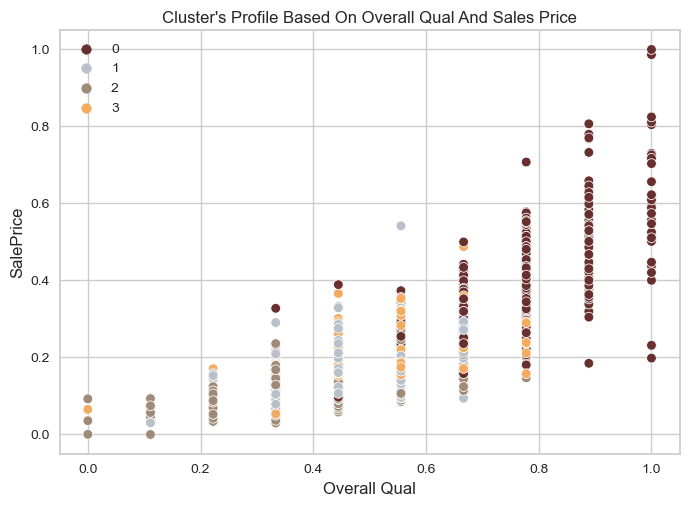

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

pl = sns.scatterplot(data=dataset, x=dataset["Overall Qual"], y=dataset["SalePrice"], hue=dataset["Clusters"], palette=pal)
pl.set_title("Cluster's Profile Based On Overall Qual And Sales Price")
plt.legend()
plt.show()

OverallQual vs Sale Price



> Group 0: High Overall Qual & High Sales Price


> Group 1: Medium Overall Qual & Low Sales Price


> Group 2: Low Overall Qual & Low Sales Price


> Group 3: Medium Overall Qual & High Sales Price


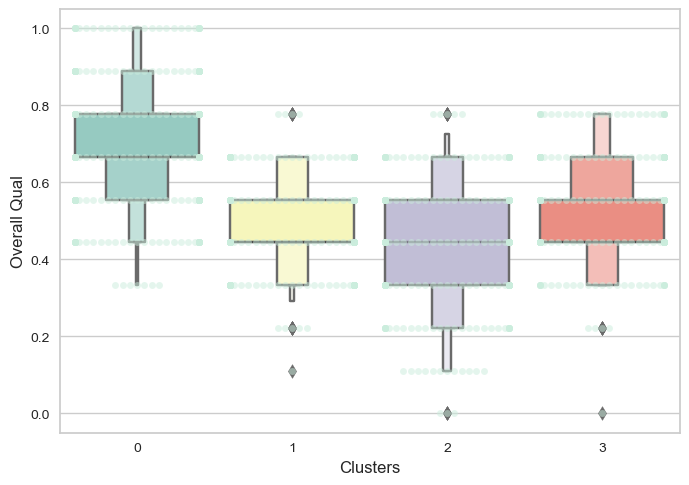

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# Additional formatting and customization as needed
plt.figure()
pl = sns.swarmplot(x=dataset["Clusters"], y=dataset["Overall Qual"], color="#CBEDDD", alpha=0.5)
pl = sns.boxenplot(x=dataset["Clusters"], y=dataset["Overall Qual"], palette="Set3")
plt.show()

> From the above plot, it can be clearly seen that cluster 0 is our biggest set of customers

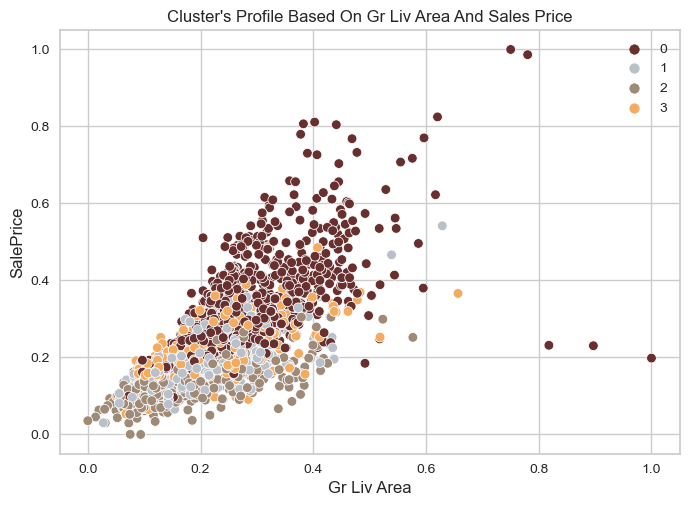

In [ ]:
pl = sns.scatterplot(data=dataset, x=dataset["Gr Liv Area"], y=dataset["SalePrice"], hue=dataset["Clusters"], palette=pal)
pl.set_title("Cluster's Profile Based On Gr Liv Area And Sales Price")
plt.legend()
plt.show()

GrLivArea vs Sale Price shows the clusters pattern

> Group 0: Large Gr Liv Area & High Sales Price

> Group 1: Medium Gr Liv Area & Low Sales Price

> Group 2: Small Gr Liv Area & Low Sales Price

> Group 3: Medium Gr Liv Area & High Sales Price

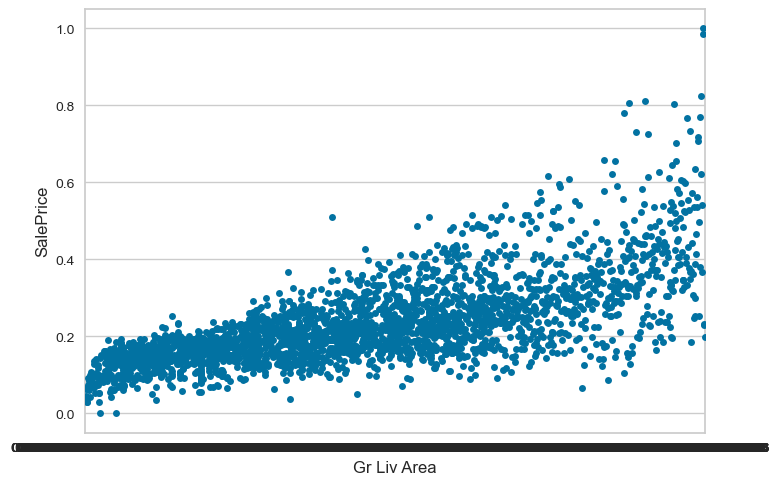

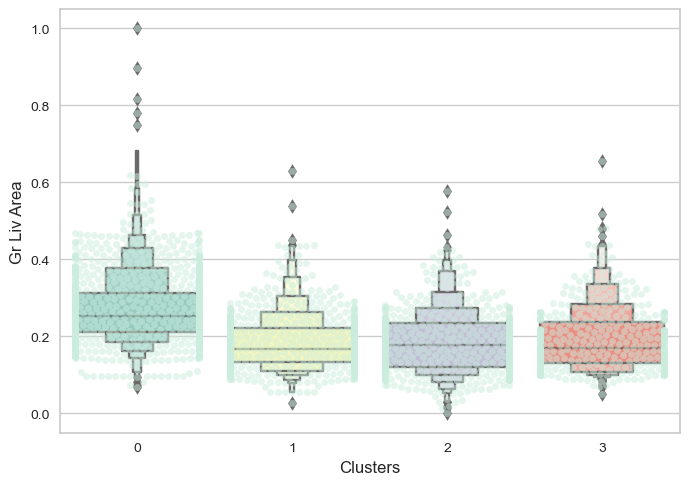

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.stripplot(x='Gr Liv Area', y='SalePrice', data=dataset)
plt.figure()
pl = sns.swarmplot(x=dataset["Clusters"], y=dataset["Gr Liv Area"], color="#CBEDDD", alpha=0.5)
pl = sns.boxenplot(x=dataset["Clusters"], y=dataset["Gr Liv Area"], palette="Set3")
plt.show()

From the above plot, it can be clearly seen that cluster 0 is our biggest set of customers.

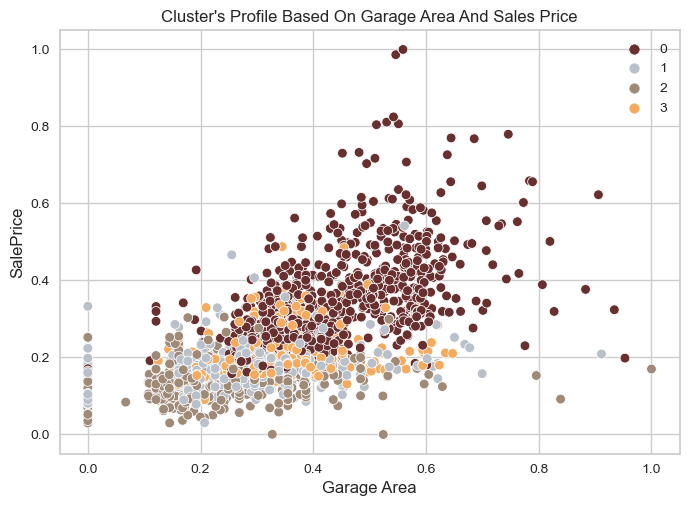

In [ ]:
pl = sns.scatterplot(data=dataset, x=dataset["Garage Area"], y=dataset["SalePrice"], hue=dataset["Clusters"], palette=pal)
pl.set_title("Cluster's Profile Based On Garage Area And Sales Price")
plt.legend()
plt.show()

Garage Area vs Sale Price shows the clusters pattern

> Group 0: Large Garage Area & High Sales Price

> Group 1: Medium Garage Area & Low Sales Price

> Group 2: Small Garage Area & Low Sales Price

> Group 3: Medium Garage Area & High Sales Price



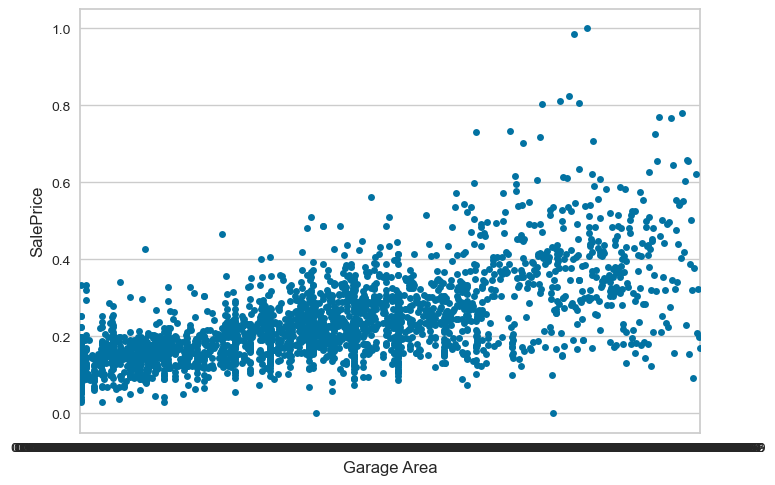

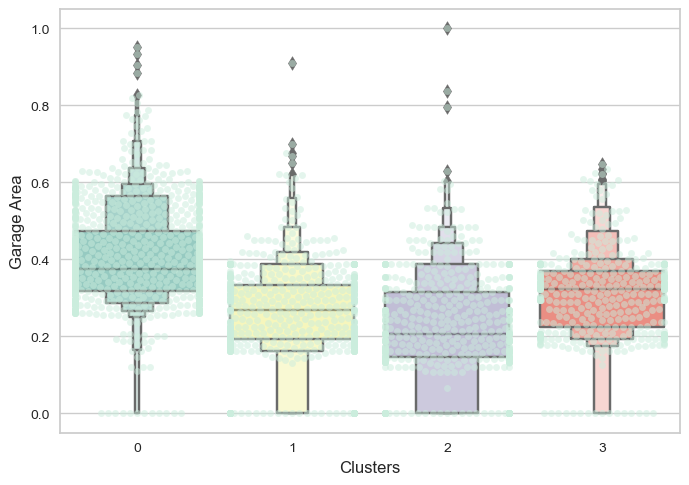

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.stripplot(x='Garage Area', y='SalePrice', data=dataset)
plt.figure()
pl = sns.swarmplot(x=dataset["Clusters"], y=dataset["Garage Area"], color="#CBEDDD", alpha=0.5)
pl = sns.boxenplot(x=dataset["Clusters"], y=dataset["Garage Area"], palette="Set3")
plt.show()

From the above plot, it can be clearly seen that cluster 0 is our biggest set of customers.

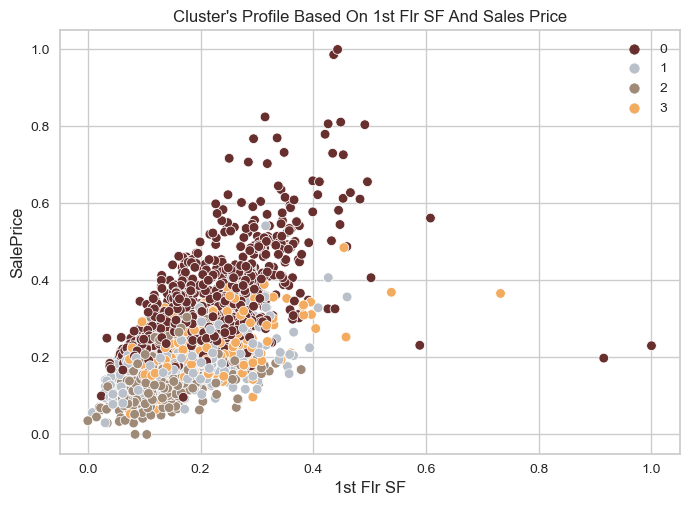

In [ ]:
pl = sns.scatterplot(data=dataset, x=dataset["1st Flr SF"], y=dataset["SalePrice"], hue=dataset["Clusters"], palette=pal)
pl.set_title("Cluster's Profile Based On 1st Flr SF And Sales Price")
plt.legend()
plt.show()

1stFlrSF vs Sale Price shows the clusters pattern


> Group 0: Large 1st Flr SF & High Sales Price

> Group 1: Medium 1st Flr SF & Low Sales Price

> Group 2: Small 1st Flr SF & Low Sales Price

> Group 3: Medium 1st Flr SF & High Sales Price










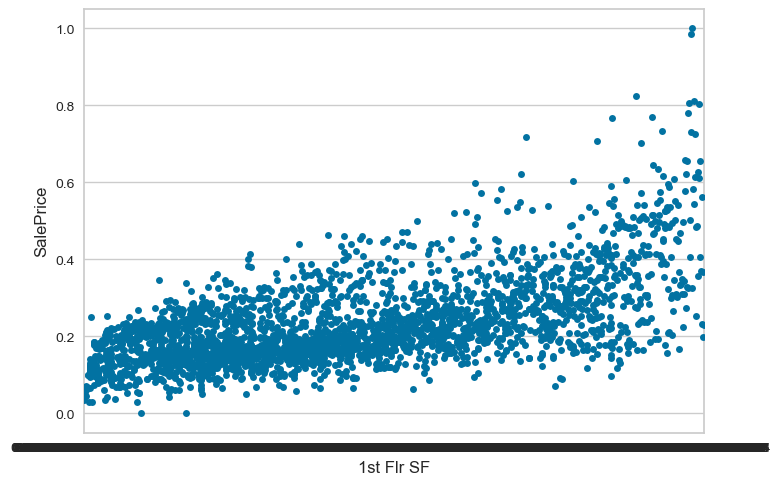

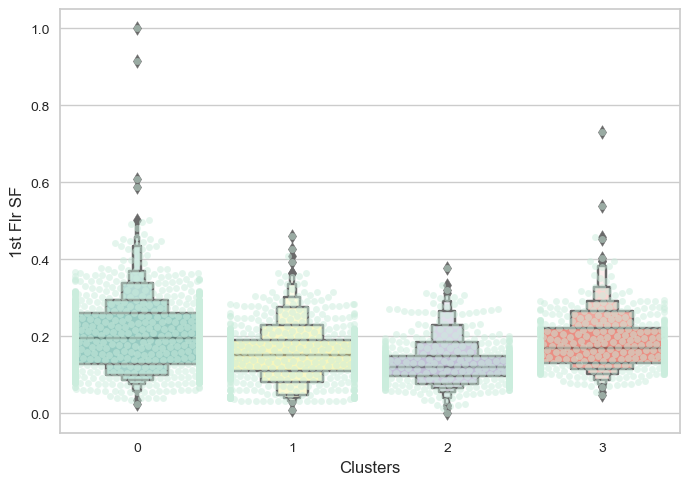

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.stripplot(x='1st Flr SF', y='SalePrice', data=dataset)
plt.figure()
pl = sns.swarmplot(x=dataset["Clusters"], y=dataset["1st Flr SF"], color="#CBEDDD", alpha=0.5)
pl = sns.boxenplot(x=dataset["Clusters"], y=dataset["1st Flr SF"], palette="Set3")
plt.show()

From the above plot, it can be clearly seen that cluster 0 is our biggest set of customers.

<font color="purple">**Profiling**</font>

The clusters have been formed and the buying habits of customers have been analyzed, it's time to explore the key factors that define residential properties within these clusters. The objective is to identify the type of residential properties preferred by customers.To achieve this, relevant features will be plotted based on their cluster assignments. These plots will indicate the characteristics of residential properties, allowing conclusions to be drawn about the specific types favored by customers.

<Figure size 800x550 with 0 Axes>

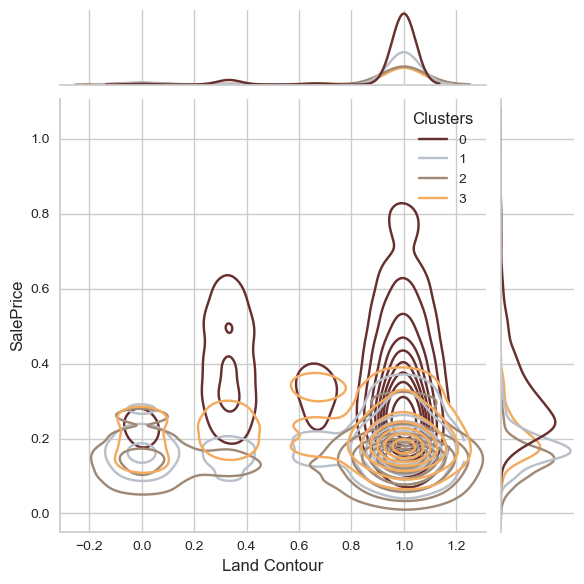

<Figure size 800x550 with 0 Axes>

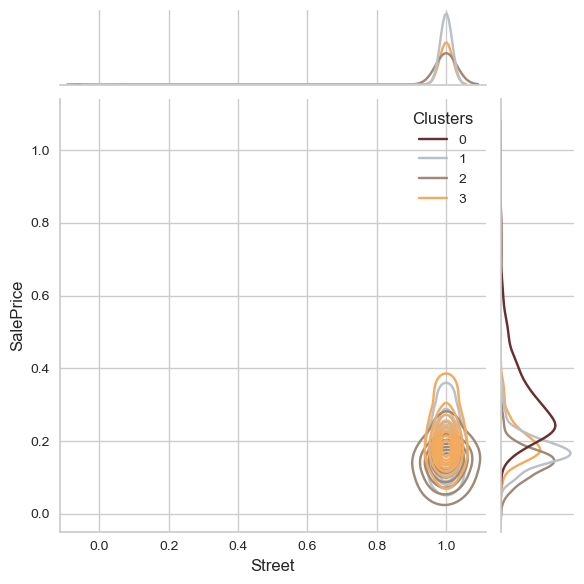

<Figure size 800x550 with 0 Axes>

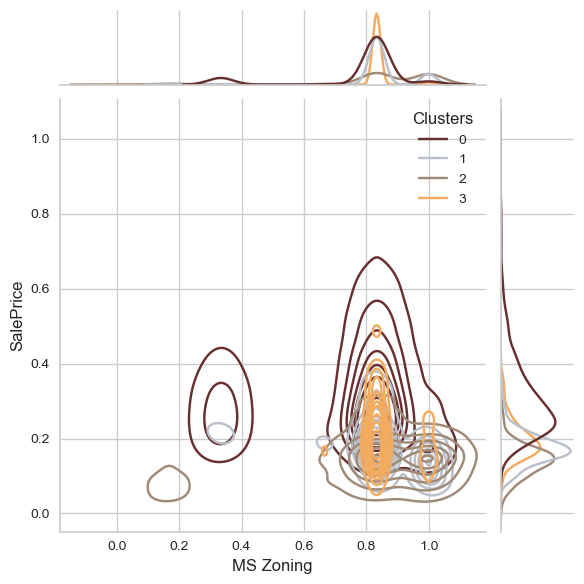

<Figure size 800x550 with 0 Axes>

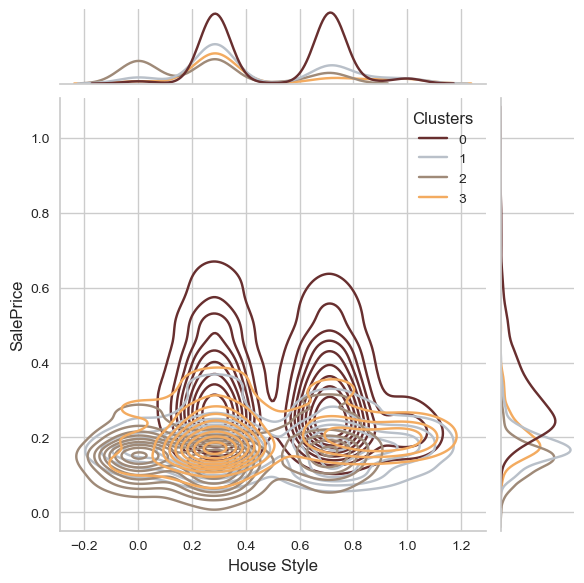

In [ ]:
Personal = ["Land Contour", "Street", "MS Zoning","House Style"]

# Define the color palette
pal = ["#682F2F", "#B9C0C9", "#9F8A78", "#F3AB60"]

for i in Personal:
    plt.figure()
    sns.jointplot(x=dataset[i], y=dataset["SalePrice"], hue=dataset["Clusters"], kind="kde", palette=pal)
    plt.show()

### **Profiling The Clusters**


> Cluster Number 0:
Customers in this cluster prefer houses with high overall quality, large living areas, spacious garage areas, and a large first floor. They are willing to pay a high sales price for such houses. They also prefer houses with a one-story design. Land contour being level and street being gravel are not significant factors for them.

> Cluster Number 1:
Customers in this cluster have medium preferences across various features. They look for houses with medium overall quality, living areas, garage areas, and first floor sizes. However, they are willing to pay a high sales price. They are open to different house styles, including one and a half story, split foyer, split level, and more. They prefer properties located on a variety of land contours (level, banked, hillside, low) and paved streets. They are also open to different zoning options, including residential and commercial.

> Cluster Number 2:
Customers in this cluster have relatively lower preferences compared to other clusters. They prefer houses with low overall quality, small living areas, compact garage areas, and small first floor sizes. They are looking for affordable options with lower sales prices. They prefer one-story houses, split foyer, and two and a half story designs. They are open to different land contour options (level, hillside, low) and paved streets. They prefer residential low-density zoning and floating village residential zoning.

> Cluster Number 3:
Customers in this cluster also have medium preferences, but with a focus on smaller house features. They prefer houses with medium overall quality but with lower preferences for living areas, garage areas, and first floor sizes. They are willing to pay lower sales prices. They prefer one and a half story houses, split foyer, split level, and more. They are open to different land contour options (level, banked, hillside, low) and paved streets. They prefer residential low-density zoning, residential medium-density zoning, residential high-density zoning, and floating village residential zoning.






















![Part%204%20and%205%20-%20Xing%20Yu.jpg](attachment:Part%204%20and%205%20-%20Xing%20Yu.jpg)

### t-SNE

t-SNE (t-Distributed Stochastic Neighbor Embedding) is perfomed for dimensionality reduction and visualization of the data.

### Function:

- Calculates the t-SNE coordinates
- Creates a dendrogram through hierarchical clustering
- Determines the number of clusters visually, assigns data points to clusters
- Computes centroids for each cluster
- Generates scatter plots to visualize the t-SNE coordinates colored by the original variable and cluster assignments
- Includes a bar plot showing the cluster frequencies and evaluates clustering quality using silhouette analysis.

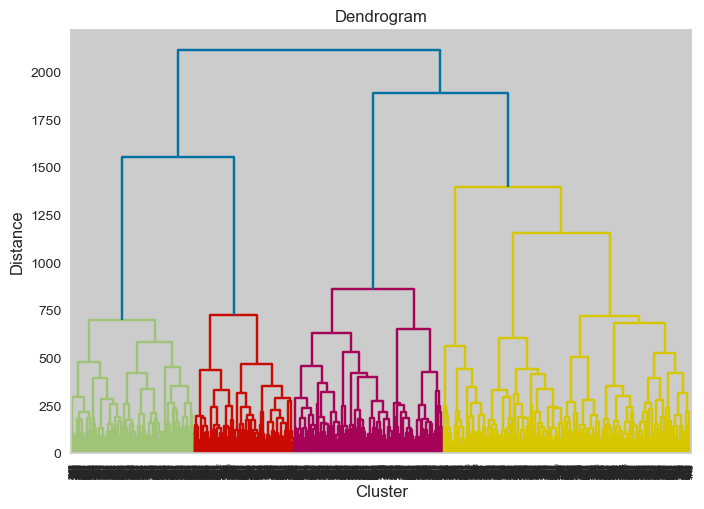

In [ ]:
#t-SNE
#Hierarchical Clustering
import numpy as np
import pandas as pd
import warnings
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.manifold import TSNE
warnings.filterwarnings("ignore")


# Perform t-SNE embedding
tsne = TSNE(n_components=2)
tsne_embedding = tsne.fit_transform(dataset)
tsne_df = pd.DataFrame(tsne_embedding, columns=['Y.1', 'Y.2'])

dist_mat = squareform(pdist(tsne_embedding, metric='euclidean'))
hclust_avg = linkage(dist_mat, method='average')

# Plot dendrogram (Hierarchical Clustering)
dend = dendrogram(hclust_avg)

plt.xlabel('Cluster')
plt.ylabel('Distance')
plt.title('Dendrogram')

plt.show()

In [ ]:
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import matplotlib.pyplot as plt

Z = linkage(dataset, method='average')

# Cut the dendrogram to obtain cluster assignments
k = 5
cut_avg = fcluster(Z, k, criterion='maxclust')

# Print the cluster assignments
print("Cluster:", cut_avg)

Cluster: [2 2 2 ... 2 2 1]


We set the K = 5 to cut the dendrogram in order to obtain the cluster assignments.
After that, we plot a scatter plots to visualize the t-SNE coordinates colored by the original variable and cluster assignments
From the graph, we can see that there are 5 clusters, the lighter the color, the higher the pricing is.


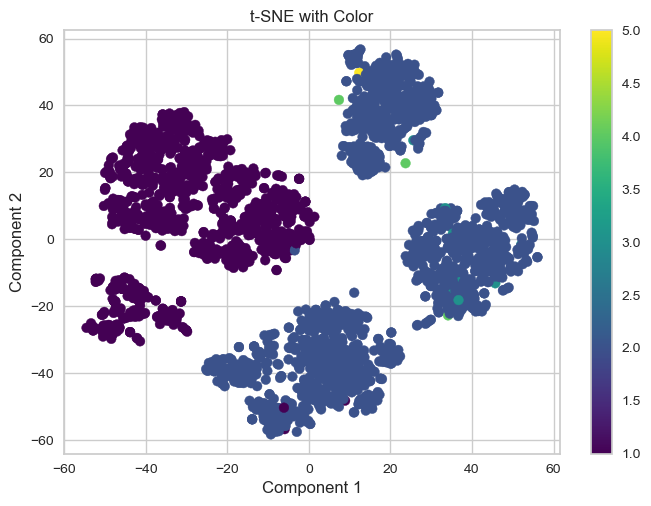

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

X = dataset

# Specify the number of dimensions in the t-SNE representation
n_components = 2

# Perform t-SNE
tsne = TSNE(n_components=n_components, random_state=42)
X_tsne = tsne.fit_transform(X)

# Plot the t-SNE representation with color based on labels
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=cut_avg, cmap='viridis')
plt.title("t-SNE with Color")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.colorbar()
plt.show()

#### Silhouette
Silhouette is a metric that measures how close each sample in a cluster is to the samples in neighboring clusters. Higher values indicate better-defined clusters.

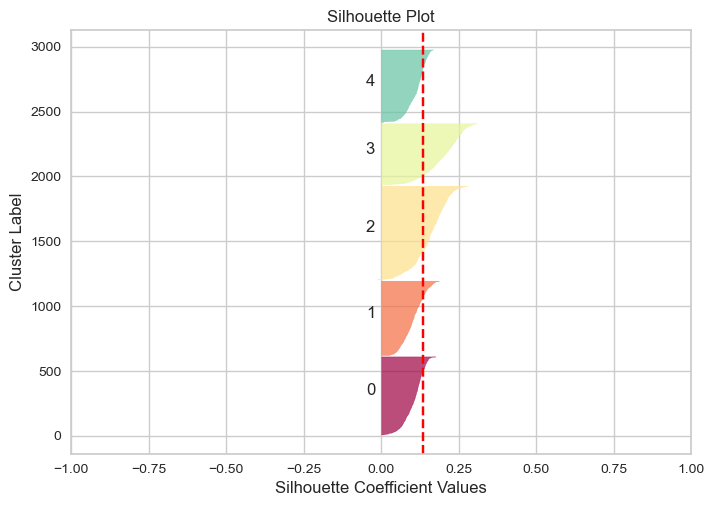

Average Silhouette Width: 0.13356375855039126


In [ ]:
#Evaluation using silhouette
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

X = dataset
# Specify the number of clusters
k = 5

# Perform clustering using K-means
kmeans = KMeans(n_clusters=k, random_state=42)
cluster_labels = kmeans.fit_predict(X)

# Compute silhouette scores for each sample
silhouette_avg = silhouette_score(X, cluster_labels)
sample_silhouette_values = silhouette_samples(X, cluster_labels)

# Create a plot with a silhouette coefficient for each sample
fig, ax = plt.subplots()
y_lower = 10

for i in range(k):
    # Aggregate the silhouette scores for samples in cluster i and sort them
    cluster_i_values = sample_silhouette_values[cluster_labels == i]
    cluster_i_values.sort()

    # Set the color for the plot
    color = plt.cm.get_cmap("Spectral")(float(i) / k)

    # Compute the height of the bar
    y_upper = y_lower + cluster_i_values.shape[0]

    # Plot the silhouette coefficients
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_i_values, facecolor=color, edgecolor=color, alpha=0.7)

    # Label the silhouette plot with the cluster number
    ax.text(-0.05, y_lower + 0.5 * cluster_i_values.shape[0], str(i))

    # Compute the new y_lower for the next plot
    y_lower = y_upper + 10

# Set the plot aesthetics
ax.set_title("Silhouette Plot")
ax.set_xlabel("Silhouette Coefficient Values")
ax.set_ylabel("Cluster Label")

# Set the x-axis limits
ax.set_xlim([-1, 1])

# Show the average silhouette score as a vertical line
ax.axvline(x=silhouette_avg, color="red", linestyle="--")

# Display the plot
plt.show()

silhouette_width = np.mean(sample_silhouette_values)

# Print the average silhouette width
print("Average Silhouette Width:", silhouette_width)

#See the width and average.

The average silhouette width value of 0.1346 suggests that the clustering of the data points is moderately well-defined.

In [ ]:
#Split data set
from sklearn.model_selection import train_test_split

# Split the data into train and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the train set further into train and validation sets (70% train, 30% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=42)

print("Train set shape:", X_train.shape)
print("Validation set shape:", X_val.shape)
print("Test set shape:", X_test.shape)

validate_rmse_score = []
validate_model_name = []
test_rmse_score = []
test_model_name = []

Train set shape: (1640, 72)
Validation set shape: (704, 72)
Test set shape: (586, 72)


#### Model Used
DecisionTreeRegressor, KNeighborsRegressor, RandomForestRegressor

#### Evaluation
RMSE (Root Mean Squared Error): A measure of the average difference between predicted and actual values. Lower values indicate better accuracy.

MSE (Mean Squared Error): The average squared difference between predicted and actual values. It provides an overall measure of prediction error.

MAPE (Mean Absolute Percentage Error): Represents the average percentage difference between predicted and actual values. Higher values indicate higher prediction errors.

MAE (Mean Absolute Error): The average absolute difference between predicted and actual values. It measures the average magnitude of errors.

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mse = mean_squared_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    mae = mean_absolute_error(y_true, y_pred)

    return rmse, mse, mape, mae

In [ ]:
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from tabulate import tabulate

# Create an instance of DecisionTreeRegressor
dt_reg = DecisionTreeRegressor()
dt_reg.fit(X_train, y_train)

# Make predictions on the validation set
y_val_pred = dt_reg.predict(X_val)

# Make predictions on the test set
y_test_pred = dt_reg.predict(X_test)


# Evaluation for Validate
val_rmse, val_mse, val_mape, val_mae = calculate_metrics(y_val, y_val_pred)
# Evaluation for Test
test_rmse, test_mse, test_mape, test_mae = calculate_metrics(y_test, y_test_pred)
# Create the table
table = [["RMSE", val_rmse, test_rmse], ["MSE",val_mse, test_mse], ["MAPE",val_mape, test_mape], ["MAE",val_mae, test_mae]]
# Display the table
print(tabulate(table, headers=["Metric", "Val Value", "Test Value"], tablefmt="grid"))

#Append RMSE to array
validate_rmse_score.append(val_rmse)
validate_model_name.append("Decision Tree")
test_rmse_score.append(test_rmse)
test_model_name.append("Decision Tree")

+----------+-------------+--------------+
| Metric   |   Val Value |   Test Value |
+==========+=============+==============+
| RMSE     |   0.170563  |    0.171896  |
+----------+-------------+--------------+
| MSE      |   0.0290919 |    0.0295483 |
+----------+-------------+--------------+
| MAPE     | 212.762     |  247.425     |
+----------+-------------+--------------+
| MAE      |   0.126909  |    0.131085  |
+----------+-------------+--------------+


In [ ]:
# K-Nearest Neighbors Regressor model
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error

model = KNeighborsRegressor(n_neighbors=5)
model.fit(X_train, y_train)

# Make predictions on the validation set
y_val_pred = model.predict(X_val)

# Make predictions on the test set
y_test_pred = model.predict(X_test)

# Evaluation for Validate
val_rmse, val_mse, val_mape, val_mae = calculate_metrics(y_val, y_val_pred)
# Evaluation for Test
test_rmse, test_mse, test_mape, test_mae = calculate_metrics(y_test, y_test_pred)
# Create the table
table = [["RMSE", val_rmse, test_rmse], ["MSE",val_mse, test_mse], ["MAPE",val_mape, test_mape], ["MAE",val_mae, test_mae]]
# Display the table
print(tabulate(table, headers=["Metric", "Val Value", "Test Value"], tablefmt="grid"))

#Append RMSE to array
validate_rmse_score.append(val_rmse)
validate_model_name.append("KNN")
test_rmse_score.append(test_rmse)
test_model_name.append("KNN")

+----------+-------------+--------------+
| Metric   |   Val Value |   Test Value |
+==========+=============+==============+
| RMSE     |   0.146117  |    0.149374  |
+----------+-------------+--------------+
| MSE      |   0.0213502 |    0.0223125 |
+----------+-------------+--------------+
| MAPE     | 137.403     |  202.19      |
+----------+-------------+--------------+
| MAE      |   0.110247  |    0.114048  |
+----------+-------------+--------------+


In [ ]:
# Random Forest Regressor model
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Make predictions on the validation set
y_val_pred = model.predict(X_val)

# Make predictions on the test set
y_test_pred = model.predict(X_test)

# Evaluation for Validate
val_rmse, val_mse, val_mape, val_mae = calculate_metrics(y_val, y_val_pred)
# Evaluation for Test
test_rmse, test_mse, test_mape, test_mae = calculate_metrics(y_test, y_test_pred)
# Create the table
table = [["RMSE", val_rmse, test_rmse], ["MSE",val_mse, test_mse], ["MAPE",val_mape, test_mape], ["MAE",val_mae, test_mae]]
# Display the table
print(tabulate(table, headers=["Metric", "Val Value", "Test Value"], tablefmt="grid"))

#Append RMSE to array
validate_rmse_score.append(val_rmse)
validate_model_name.append("RF")
test_rmse_score.append(test_rmse)
test_model_name.append("RF")

+----------+-------------+--------------+
| Metric   |   Val Value |   Test Value |
+==========+=============+==============+
| RMSE     |   0.118594  |    0.116291  |
+----------+-------------+--------------+
| MSE      |   0.0140647 |    0.0135235 |
+----------+-------------+--------------+
| MAPE     | 113.083     |  144.273     |
+----------+-------------+--------------+
| MAE      |   0.0903059 |    0.0880571 |
+----------+-------------+--------------+


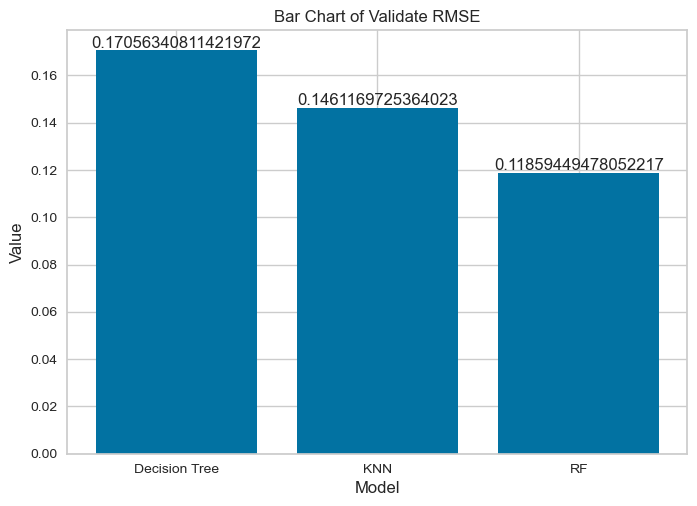

In [ ]:
#Comparison in Validate RMSE
import matplotlib.pyplot as plt

plt.bar(range(len(validate_rmse_score)), validate_rmse_score)
plt.xlabel('Model')
plt.ylabel('Value')
plt.title('Bar Chart of Validate RMSE')

for i, value in enumerate(validate_rmse_score):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.xticks(range(len(validate_rmse_score)), validate_model_name)
plt.show()

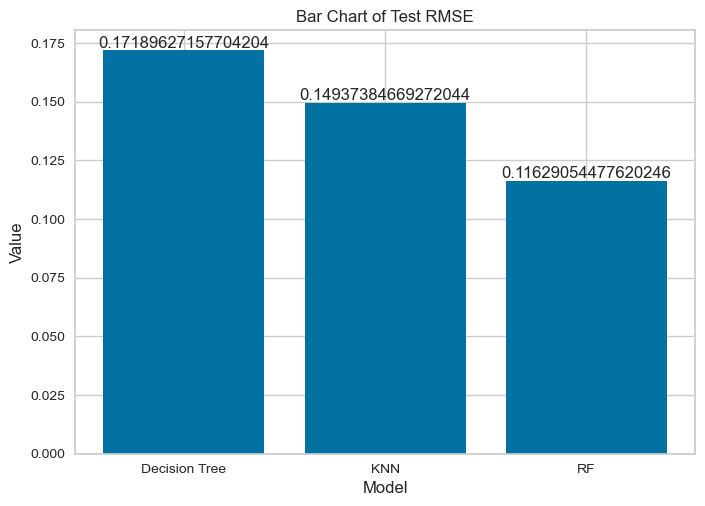

In [ ]:
#Comparison in Test RMSE
import matplotlib.pyplot as plt

plt.bar(range(len(test_rmse_score)), test_rmse_score)
plt.xlabel('Model')
plt.ylabel('Value')
plt.title('Bar Chart of Test RMSE')

for i, value in enumerate(test_rmse_score):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.xticks(range(len(test_rmse_score)), test_model_name)
plt.show()

The Lower the RMSE, the better the result. in this scenario, Random Forest perfrom the best follow by Knn and decision tree.

- In this scenario, the baseline models would be DecisionTreeRegressor and KNeighborsRegressor, while the ensemble model would be RandomForestRegressor The baseline models are typically simpler models that serve as a starting point or reference for comparison.

- On the other hand, RandomForestRegressor is an ensemble model that combines multiple decision trees to make predictions and  to improve overall performance.

- Thus we conclude that Ensembles work better in this scenario.


![Part%206.jpg](attachment:Part%206.jpg)




### Plan deployment
#### 1.Market Research and Analysis:

①Identify target market segments and their preferences.

②Analyze market trends, demand-supply dynamics, and competition.

③Evaluate the economic, social, and regulatory factors impacting the real estate sector.



#### 2.Conceptualization and Idea Generation:

①Brainstorm and generate innovative ideas for real estate development.

②Consider factors such as location, property type (residential, commercial, mixed-use), amenities, and target demographics.

③Develop a unique selling proposition (USP) that differentiates the project from competitors.



#### 3.Feasibility Study:

①Conduct a thorough feasibility study to assess the project's viability.

②Evaluate financial aspects, including project costs, expected returns, and profitability.

③Assess technical feasibility, land availability, zoning regulations, and environmental impact.

④Identify potential risks and challenges and develop mitigation strategies.




### Plan monitoring and maintenance
#### 1.Data Collection and Integration:

①Continuously collect relevant real estate data, including property sales, rental prices, market trends, and economic indicators.

②Integrate the collected data into the model's database or data repository.

③Ensure data accuracy, completeness, and consistency.




#### 2.Data Validation and Cleaning:

①Regularly validate and clean the collected data to remove duplicates, errors, outliers, and missing values.

②Implement data quality checks and validation processes to maintain data integrity.



#### 3.Regular Model Evaluation:

①Conduct periodic evaluations of the model's performance against the defined performance metrics.

②Compare the model's predictions or outputs with the actual outcomes or market observations.

③Identify any discrepancies, deviations, or areas where the model is not meeting expectations.



#### 4.Feedback Collection:

①Gather feedback from users, stakeholders, customers, or real estate professionals who interact with the model.

②Collect feedback on the model's usability, accuracy, relevance, and effectiveness.

③Consider conducting surveys, interviews, or feedback sessions to capture valuable insights.



#### 5.Model Calibration and Updates:

①Analyze the feedback and evaluation results to identify areas for improvement or model calibration.

②Adjust the model parameters, algorithms, or methodologies as necessary to enhance its performance.

③Implement regular model updates or version releases to incorporate improvements and address identified issues.



#### 6.Documentation and Audit:

①Maintain comprehensive documentation of the model, including its methodology, data sources, assumptions, and updates.

②Conduct periodic audits or reviews of the model to ensure compliance with regulatory requirements and internal policies.

③Document any changes made to the model, along with justifications and approvals.



#### 7.Continuous Improvement:

①Foster a culture of continuous improvement by encouraging feedback, learning, and collaboration.

②Stay updated on industry advancements, best practices, and emerging technologies related to real estate modeling.

③Seek opportunities to enhance the model's performance through innovations, new data sources, or advanced analytics techniques.